In [35]:

import time
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('white')
# import statsmodels.api as sm

from sklearn import preprocessing 
import ema_workbench.em_framework.evaluators
# from ema_workbench.analysis import feature_scoring
# from ema_workbench.em_framework.salib_samplers import get_SALib_problem
# from SALib.analyze import sobol



from dicemodel.noDICE_v3 import PyDICE
model_version = 'v3.5'

import os
from dest_directories import gz_path, fig_path

In [36]:
from ema_workbench import (perform_experiments, Model, Policy, Scenario, ReplicatorModel, RealParameter, IntegerParameter, TimeSeriesOutcome, ScalarOutcome, ArrayOutcome, Constant, ema_logging, SequentialEvaluator, MultiprocessingEvaluator, IpyparallelEvaluator)
from ema_workbench import save_results, load_results
# from ema_workbench.analysis import prim, cart
from ema_workbench.analysis import scenario_discovery_util as sdutil
from ema_workbench.analysis import plotting, plotting_util

ema_logging.log_to_stderr(ema_logging.INFO)

<Logger EMA (DEBUG)>

# Time series 

In [37]:
n_scenarios = 100
n_policies = 20
exp_spec_name = 'DamageFunc' #'VD_fixed_EMUC' 'DICE2013'
outcome_spec_name = 'light'

In [43]:
from run_specifications import exp_spec, outcome_spec
if __name__ == '__main__':
    ema_logging.log_to_stderr(ema_logging.INFO)
    

    dice_sm.uncertainties, dice_sm.levers = exp_spec('VD_fixed_EMUC')
    # dice_sm.outcomes = outcome_spec('light')
    dice_sm.outcomes = [#TimeSeriesOutcome('Atmospheric Temperature'),
                        # TimeSeriesOutcome('Total Output'),
                        # TimeSeriesOutcome('Population'),
                        TimeSeriesOutcome('Per Capita Consumption'),
                        # TimeSeriesOutcome('Consumption Growth'),
                        TimeSeriesOutcome('Utility of Consumption'),
                        TimeSeriesOutcome('Per Capita Damage'),
                        # TimeSeriesOutcome('Damage Growth'),
                        TimeSeriesOutcome('Disutility of Damage'),
                        TimeSeriesOutcome('Welfare'),
                        TimeSeriesOutcome('Undiscounted Period Welfare'),
                        # TimeSeriesOutcome('Consumption SDR'),
                        # TimeSeriesOutcome('Damage SDR')

                        ]

    

In [44]:
start = time.time()
with MultiprocessingEvaluator(dice_sm, n_processes=8) as evaluator:
    results = evaluator.perform_experiments(scenarios=n_scenarios, policies=n_policies)
end = time.time()

print('Experiment time is ' + str(round((end - start)/60)) + ' mintues')

[MainProcess/INFO] pool started
[MainProcess/INFO] performing 100 scenarios * 20 policies * 1 model(s) = 2000 experiments
[MainProcess/INFO] 200 cases completed
[MainProcess/INFO] 400 cases completed
[MainProcess/INFO] 600 cases completed
[MainProcess/INFO] 800 cases completed
[MainProcess/INFO] 1000 cases completed
[MainProcess/INFO] 1200 cases completed
[MainProcess/INFO] 1400 cases completed
[MainProcess/INFO] 1600 cases completed
[MainProcess/INFO] 1800 cases completed
[MainProcess/INFO] 2000 cases completed
[MainProcess/INFO] experiments finished
[MainProcess/INFO] terminating pool
Experiment time is 0 mintues


In [45]:
experiments, outcomes = results

In [9]:
# pydice_folder = os.path.dirname(os.getcwd())+"\\1_Model"
# sys.path.insert(1, pydice_folder)
# file_name = 'exploration_V4_' + str(n_scenarios) + 'scen_' + 'nordhaus_optimal_policy_' + str(4) + 'obj' + '.tar.gz'
# #save_results(results, file_name)

save_results(results, os.path.join(gz_path, '1a_' + str(exp_spec_name) +  '2300_' + str(n_scenarios) + 's_' + str(n_policies) + 'p_' + str(model_version) + '.tar.gz'))


[MainProcess/INFO] results saved successfully to E:\Year_2_Quarter_4\Thesis\06_Code\results\gz_files\1a_DamageFunc2300_100s_20p_v3.5.tar.gz


In [ ]:
# results = load_results(os.path.join(gz_path,'1a_OE_1000s_20p_v3.3.tar.gz'))
# experiments, outcomes = results
# # outcomes

In [20]:
experiments.dtypes

cback             float64
fosslim           float64
pop_gr            float64
sigma_gr          float64
t2xco2_index      float64
tfp_gr            float64
emdd              float64
emuc              float64
miu_period        float64
periodfullpart    float64
prtp_con          float64
prtp_dam          float64
sr                float64
scenario           object
policy             object
model              object
dtype: object

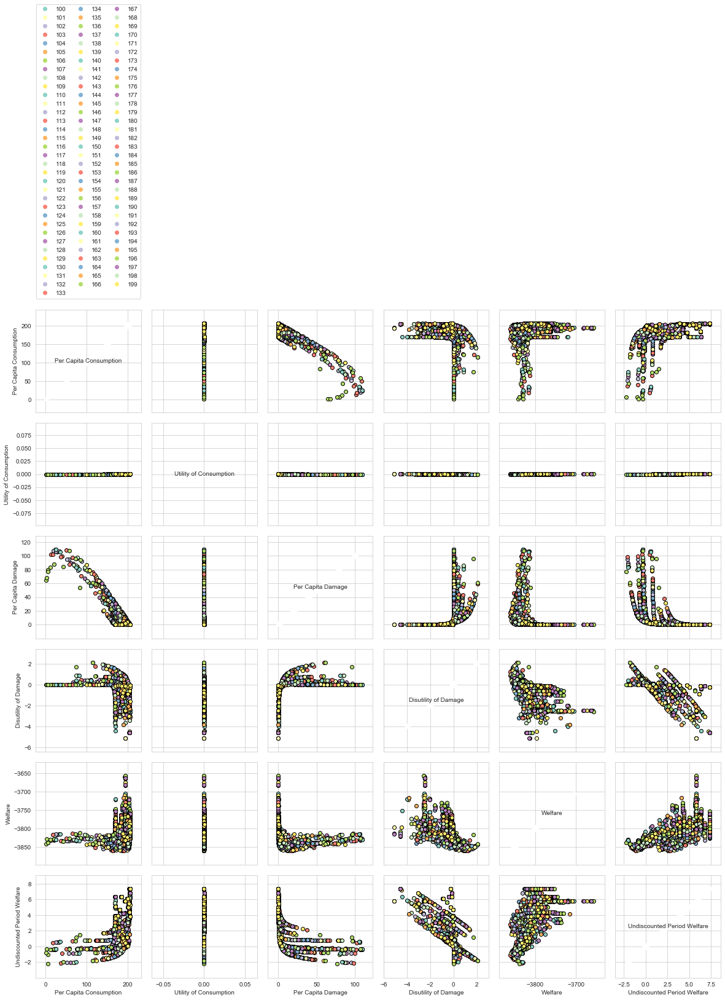

In [61]:
## pairs plotting 2300
from ema_workbench.analysis import pairs_plotting, plotting_util
fig, axes = pairs_plotting.pairs_scatter(experiments,outcomes, group_by='policy',legend=True) # can I group by intervals?
fig.set_size_inches(20,20)
plt.show() 

In [11]:
fig.savefig(os.path.join(fig_path,'1a_pairsplot' +str(exp_spec_name) + '2300_' + str(n_scenarios) + 's_' + str(n_policies) + 'p_' + str(model_version) + '.png'))

In [20]:
grouping_specifiers = {'a':1, 'b':2, 'c':3}
grouping_labels = sorted(grouping_specifiers.keys())
grouping_specifiers = [grouping_specifiers[key] for key in
                                       grouping_labels]
grouping_specifiers

[1, 2, 3]

In [71]:
low = np.min(experiments['emdd'])
high = np.max(experiments['emdd'])
grouping_specifiers_emdd = {'Low': low, 'min to 1.3': 1.3, '1.45': 1.45, '1.45 to 1.7': 1.7,'High': high}

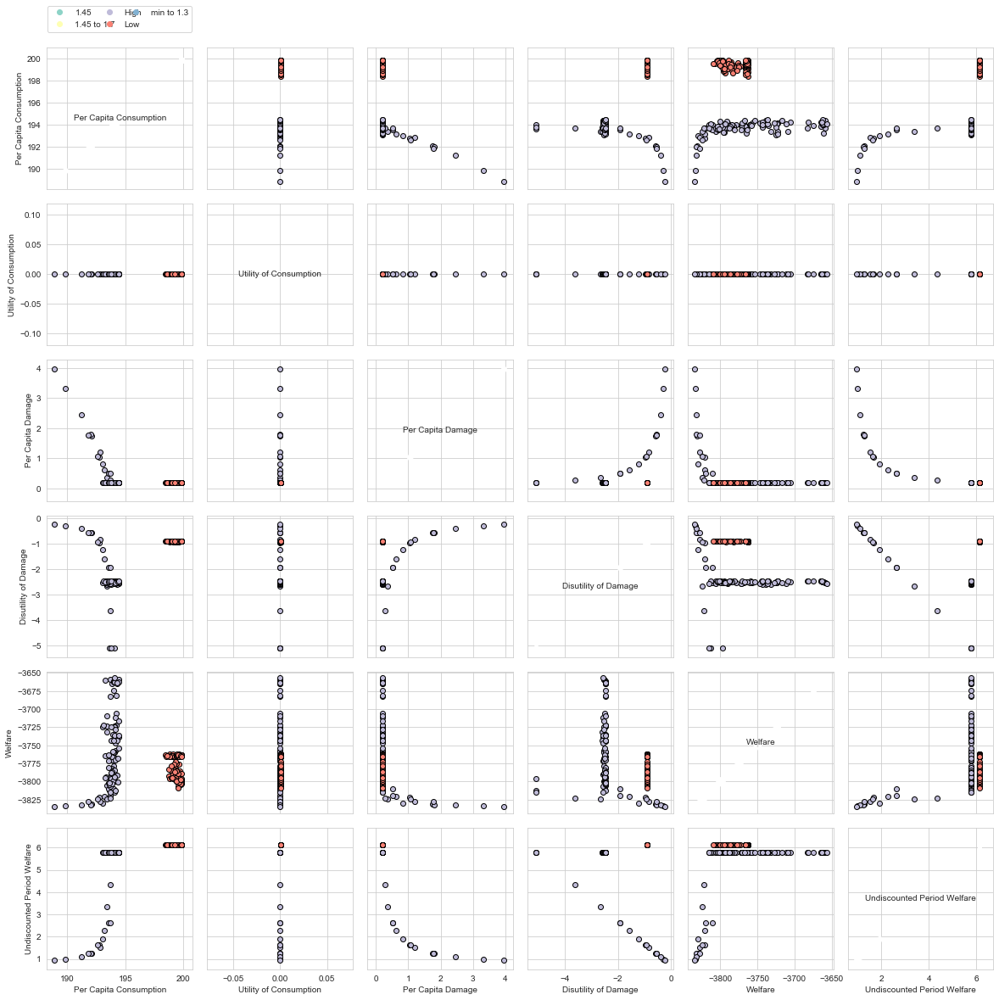

In [72]:
## pairs plotting
from ema_workbench.analysis import pairs_plotting, plotting_util
fig, axes = pairs_plotting.pairs_scatter(experiments,outcomes, group_by='emdd',grouping_specifiers=grouping_specifiers_emdd, legend=True) # can I group by intervals?
fig.set_size_inches(20,20)
plt.show()


In [65]:
fig.savefig(os.path.join(fig_path,'1a_pairsplot_grouping.png'))
# fig.savefig(os.path.join(fig_path,'1a_pairsplot' + str(exp_spec_name) + '_' + str(n_scenarios) + 's_' + str(n_policies) + 'p_' + str(model_version) + '.png'))

In [57]:
TimeLine = []
for i in range(60):
    TimeLine.append(2010+i*5)
TimeLine
outcomes["TIME"] = np.array([TimeLine])
outcomes.keys()

dict_keys(['Per Capita Consumption', 'Utility of Consumption', 'Per Capita Damage', 'Disutility of Damage', 'Welfare', 'Undiscounted Period Welfare', 'TIME'])

In [59]:
sns.set_style("whitegrid")

for outcome in outcomes.keys():
    fig,axes=plotting.lines(experiments, outcomes, outcomes_to_show=outcome, density=plotting.Density.BOXENPLOT)
    fig.set_size_inches(12, 5)
    fig.savefig(os.path.join(fig_path,'1a_TimeSeries_grouped' + str(outcome) + str(n_scenarios) +'s' + str(n_policies) + 'p' + '.png'))
plt.show()



AttributeError: 'DataFrame' object has no attribute 'dtype'

In [13]:
out_DF = pd.DataFrame.from_dict(outcomes)
emdd = experiments['emdd']
# out_DF['emdd'] = emdd
# out_DF['emdd'] = out_DF['emdd'].apply(lambda x: 'Lower than EMUC' if x < 1.45 else ('Equal to EMUC' if x== 1.45 else 'Higher than EMUC'))

In [36]:
outcomes['Atmospheric Temperature']

array([[0.8       , 0.90233258, 1.01241759, ..., 1.73563353, 1.68734067,
        1.64105152],
       [0.8       , 0.88413323, 0.97761585, ..., 0.88536334, 0.78741379,
        0.6900915 ],
       [0.8       , 0.96113855, 1.13216182, ..., 3.8839959 , 3.8141056 ,
        3.74645089],
       ...,
       [0.8       , 0.68452854, 0.64269627, ..., 0.63090709, 0.61256921,
        0.5949682 ],
       [0.8       , 0.96179025, 1.13176683, ..., 4.14867447, 4.05526116,
        3.96347171],
       [0.8       , 0.95346529, 1.11464276, ..., 3.5187647 , 3.39854834,
        3.27948781]])

In [34]:
for _ in range(1,6):
    colmlst = list(range(0+_*4,4+_*4))
    namelist = colmlst[:]
    colmlst[2] = -3
    namelist[2] = -2
    print(colmlst)
    print(namelist)


[4, 5, -3, 7]
[4, 5, -2, 7]
[8, 9, -3, 11]
[8, 9, -2, 11]
[12, 13, -3, 15]
[12, 13, -2, 15]
[16, 17, -3, 19]
[16, 17, -2, 19]
[20, 21, -3, 23]
[20, 21, -2, 23]


In [24]:
emdd = experiments['emdd']
out_DF['emdd'] = emdd

NameError: name 'out_DF' is not defined

In [ ]:
# To group by emdd range blocks, see below
out_DF = pd.DataFrame(outcomes)
# t2xco2_dist = experiments['t2xco2_dist']
# out_DF['ECS Distribution'] = t2xco2_dist
# out_DF['ECS Distribution'] = out_DF['ECS Distribution'].apply(lambda x: 'Normal' if x==0 else ('Log-Normal' if x==1 else 'Cauchy'))



# %%
out_DF = out_DF.sort_values([out_DF.columns[-1]], ascending=1)


# %%
sns.set(style = "whitegrid", font_scale=1.4)
for _ in range(1,6):
    colmlst = list(range(0+_*4,4+_*4))
    namelist = colmlst[:]
    colmlst[2] = -3
    namelist[2] = -2
    
    ppDF = out_DF.iloc[:,colmlst+[-1]]
    pplst_col = ppDF.columns.to_list()
    for i in range(len(pplst_col)-1):
        pplst_col[i] = pplst_col[i].replace(" ", "\n")
    ppDF.columns = pplst_col
    
    
    variable_name = list(list(outcomes.keys())[i] for i in namelist)
    for i in range(len(variable_name)):
        variable_name[i] = variable_name[i].replace(" ", "\n")
    
    
    sns_plot = sns.pairplot(ppDF, hue='emdd', palette=clr_palette,
                            vars=variable_name)
    #plt.tight_layout()
    plt.show()
    # sns_plot.savefig('pairplot_'+str(list(outcomes.keys())[_*4][-4:])+'_dist_nordhaus_opt_policy_util2300'+'_V4.png')

In [191]:
prtp_dam = 0.015
emdd = 1.45
dam_g = -0.2
tstep = 5
t= 58
dpc = 0.7

prtp_con = 0.015
emuc = 1.45
con_g = 0.09
con_g2 = 0.14
cpc = 20
cpc2 = 200

In [192]:
sdr_dam = (prtp_dam + (emdd * dam_g))
sdr_con = (prtp_con + (emuc * con_g))
sdr_con2 = (prtp_con + (emuc * con_g2))
# sdr_con = 0.015
# sdr_dam= sdr_con
# sdr_con2 = sdr_con
print(sdr_dam, sdr_con, sdr_con2)

-0.27499999999999997 0.14550000000000002 -0.1155


In [193]:
# Social discount factor for disutility of damage            
damage_sdf = (1.0 /(1.0 + sdr_dam))**(tstep * (t))
consumption_sdf = (1.0 /(1.0 + sdr_con))**(tstep * (t))
consumption_sdf2 = (1.0 /(1.0 + sdr_con2))**(tstep * (t))
print(damage_sdf, consumption_sdf, consumption_sdf2)

3.176713834812202e+40 7.787945033059062e-18 2868317342305106.0


In [194]:
import numpy as np
inst_disutil_dam = ((dpc ** (1.0 - emdd))/ (1.0 - emdd) )
# inst_disutil_dam = np.log(dpc)
inst_util_con = ((cpc ** (1.0 - emuc))/ (1.0 - emuc))
inst_util_con2 = ((cpc2 ** (1.0 - emuc))/ (1.0 - emuc))

print(inst_disutil_dam, inst_util_con, inst_util_con2)
print(inst_util_con-inst_disutil_dam)

# print(inst_util_con+inst_disutil_dam)
print(inst_util_con2-inst_disutil_dam)

-2.6091158808795023 -0.577196897674295 -0.577196897674295
2.031918983205207
2.031918983205207


In [199]:
uc_marginal = inst_util_con/cpc
uc2_marginal = inst_util_con2/cpc2
vd_marginal = inst_disutil_dam/dpc
print(uc_marginal)
print(uc2_marginal)
print(vd_marginal)

-0.028859844883714753
-0.028859844883714753
-3.727308401256432


In [195]:
disc_disutil_dam = inst_disutil_dam * damage_sdf
disc_util_con = inst_util_con * consumption_sdf
disc_util_con2 = inst_util_con2 * consumption_sdf2
print(disc_disutil_dam*1000,disc_util_con*1000, disc_util_con2*1000)
print((disc_util_con - disc_disutil_dam) * 1000)
print((disc_util_con2 - disc_disutil_dam)*1000)

-8.28841451541814e+43 -4.495177712339626e-15 -1.6555838715238863e+18
8.28841451541814e+43
8.28841451541814e+43


-1.7639663230442042
-0.07564543998155296


In [ ]:
sdr_dam = (prtp_dam + (emdd * dam_g))
            if (sdr_dam[t] < sdr_dam_lo):
                sdr_dam[t] = sdr_dam_lo
            
            # Social discount factor for disutility of damage            
            damage_sdf = (1.0 /(1.0 + sdr_dam))**(tstep * (t))
                      
            # Absolute period disutility
            if (emdd == 1.00):
                inst_disutil_dam = np.log(dpc)
            else:
                inst_disutil_dam = ((dpc ** (1.0 - emdd) - 1.0)/ (1.0 - emdd) - 1.0)
            
            # Discounted period disutility
            disc_disutil_dam = inst_disutil_dam * damage_sdf
